# Inital Setup and Residual Calculation
- LR - HR Image Pairs: The process begins with low-resolution (LR) and high-resolution (HR) image pairs
- **Residual Image Calculation**: The difference between the HR image ($x_{H}$) and the upsampled LR image ($\text{up } x_{L}$) is calculated. This difference is known as the residual image ($x_0$).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# check GPU status
! nvidia-smi

Mon Dec 18 18:14:17 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Datasets
train_dataset = '/content/drive/MyDrive/MRIDataset/traindataset'
test_dataset = '/content/drive/MyDrive/MRIDataset/testdataset'
validate_dataset = '/content/drive/MyDrive/MRIDataset/validatedataset'
train_dataset_LR = '/content/drive/MyDrive/MRIDataset/traindataset_LR'
test_dataset_LR = '/content/drive/MyDrive/MRIDataset/testdataset_LR'
validate_dataset_LR = '/content/drive/MyDrive/MRIDataset/validatedataset_LR'

In [ ]:
# directory of MRIDataset

!ls /content/drive/MyDrive/MRIDataset/


 diffusion_model.pth   rdn_testdataset	    res_train	     traindataset
'old res'	       rdn_traindataset     res_validate     traindataset_LR
 rdn_encoderv1.pth     rdn_traindatasetv2   testdataset      validatedataset
 rdn_encoderv2.pth     res_test		    testdataset_LR   validatedataset_LR


**Data Augmentation:** The functions can be used to augment image data, particularly useful in creating varied datasets for training deep learning models.

**Simulating Low-Resolution Images:** The downsampling and upsampling process simulates lower-resolution versions of images, which can be useful in tasks like super-resolution, where models learn to convert low-resolution images back to high-resolution.

**Noise and Brightness Variation:** Adding noise and adjusting brightness help in creating robust machine learning models.

In [ ]:
import os
from PIL import Image, ImageEnhance
import numpy as np
import random

def add_gaussian_noise(image, mean=0, std=10):
    """ Adds Gaussian noise to an image. """
    img_array = np.array(image)
    if img_array.shape[-1] == 4:  # Check for alpha channel
        rgb_array = img_array[:, :, :3]  # Extract RGB channels
        noise = np.random.normal(mean, std, rgb_array.shape)
        noisy_rgb_array = rgb_array + noise
        noisy_rgb_array = np.clip(noisy_rgb_array, 0, 255)
        img_array[:, :, :3] = noisy_rgb_array  # Replace RGB channels
    else:
        noise = np.random.normal(mean, std, img_array.shape)
        img_array = img_array + noise
        img_array = np.clip(img_array, 0, 255)
    noisy_image = Image.fromarray(img_array.astype('uint8'), 'RGBA' if img_array.shape[-1] == 4 else 'RGB')
    return noisy_image

def randomly_adjust_brightness(image, min_factor=1.0, max_factor=1.5):
    """ Randomly adjusts the brightness of the image. """
    rgb_image = image.convert('RGB')  # Apply brightness adjustment only to RGB channels
    enhancer = ImageEnhance.Brightness(rgb_image)
    factor = random.uniform(min_factor, max_factor)  # Randomly increase brightness
    enhanced_image = enhancer.enhance(factor)
    if image.mode == 'RGBA':
        alpha_channel = image.split()[-1]  # Extract and preserve the alpha channel
        return Image.merge('RGBA', (*enhanced_image.split(), alpha_channel))
    else:
        return enhanced_image

def downsample_add_noise_and_adjust_brightness(input_folder_path, output_folder_path, scale_factor=4):
    """ Downsamples, adds noise, and adjusts brightness of images. """
    os.makedirs(output_folder_path, exist_ok=True)

    for image_name in os.listdir(input_folder_path):
        image_path = os.path.join(input_folder_path, image_name)
        try:
            original_image = Image.open(image_path).convert('RGBA')
            original_size = original_image.size
            # Downsample and upsample
            small_image = original_image.resize((original_size[0]//scale_factor, original_size[1]//scale_factor), Image.BICUBIC)
            upsampled_image = small_image.resize(original_size, Image.BICUBIC)
            # Add noise
            noisy_image = add_gaussian_noise(upsampled_image)
            # Adjust brightness (only on RGB channels)
            bright_image = randomly_adjust_brightness(noisy_image)
            # Save the modified image
            bright_image.save(os.path.join(output_folder_path, image_name))
        except Exception as e:
            print(f"Error processing {image_name}: {e}")

In [ ]:
# Create simulated low-resolution images
downsample_add_noise_and_adjust_brightness(train_dataset, train_dataset_LR)
downsample_add_noise_and_adjust_brightness(test_dataset, test_dataset_LR)
downsample_add_noise_and_adjust_brightness(validate_dataset, validate_dataset_LR)

In [ ]:
from PIL import Image
import numpy as np
import os

def calculate_residuals(hr_folder_path, lr_folder_path, output_folder_path, scale_factor=4):
    """ Calculates the residuals between high-resolution and upsampled low-resolution images. """
    os.makedirs(output_folder_path, exist_ok=True)

    for image_name in os.listdir(hr_folder_path):
        hr_image_path = os.path.join(hr_folder_path, image_name)
        lr_image_path = os.path.join(lr_folder_path, image_name)
        try:
            hr_image = Image.open(hr_image_path).convert('RGB')
            lr_image = Image.open(lr_image_path).convert('RGB')

            # Upsample the LR image to the same size as the HR image
            lr_image_upsampled = lr_image.resize(hr_image.size, Image.BICUBIC)

            # Compute the residual
            residual_array = np.array(hr_image) - np.array(lr_image_upsampled)
            residual_array = np.clip(residual_array, -128, 127)  # Clip to allow for negative values
            residual_image = Image.fromarray(residual_array.astype('int8'), 'RGB')

            # Save the residual image
            residual_image.save(os.path.join(output_folder_path, image_name))
        except Exception as e:
            print(f"Error processing {image_name}: {e}")


In [ ]:
# Residuals folders
residual_train = '/content/drive/MyDrive/experiment/res_train'
residual_test = '/content/drive/MyDrive/experiment/res_test'
residual_validate = '/content/drive/MyDrive/experiment/res_validate'

# Calculate residuals between original high-resolution and simulated low-resolution images
calculate_residuals(train_dataset, train_dataset_LR, residual_train)
calculate_residuals(test_dataset, test_dataset_LR, residual_test)
calculate_residuals(validate_dataset, validate_dataset_LR, residual_validate)

In [ ]:
import torch
import os
from PIL import Image
from torchvision.transforms import functional as TF

def add_alpha_channel(image):
    # Convert a PIL Image from RGB to RGBA
    r, g, b = image.split()
    alpha = Image.new('L', image.size, color=255)  # Create a new alpha channel filled with 255
    image.putalpha(alpha)  # Add the alpha channel
    return image

def convert_folder_to_rgba(input_folder, output_folder):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Process each file in the input folder
    for file_name in os.listdir(input_folder):
        if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            input_path = os.path.join(input_folder, file_name)
            output_path = os.path.join(output_folder, file_name)

            try:
                # Open the image file
                image = Image.open(input_path).convert('RGB')
                # Add an alpha channel
                image = add_alpha_channel(image)
                # Save the image
                image.save(output_path, format='PNG')  # Save as PNG to ensure alpha is preserved

                print(f"Converted and saved: {file_name}")
            except Exception as e:
                print(f"Failed to process {file_name}: {e}")


In [ ]:

# Residuals folders
residual_train = '/content/drive/MyDrive/experiment/res_train'
residual_test = '/content/drive/MyDrive/experiment/res_test'
residual_validate = '/content/drive/MyDrive/experiment/res_validate'
residual_trainA = '/content/drive/MyDrive/experiment/res_trainA'
residual_testA = '/content/drive/MyDrive/experiment/res_testA'
residual_validateA = '/content/drive/MyDrive/experiment/res_validateA'

# Convert all images in the folder to RGBA
convert_folder_to_rgba(residual_train, residual_trainA)
convert_folder_to_rgba(residual_test, residual_testA)
convert_folder_to_rgba(residual_validate, residual_validateA)

In [ ]:
# Residuals folders
residual_train = '/content/drive/MyDrive/MRIDataset/res_trainA'
residual_test = '/content/drive/MyDrive/MRIDataset/res_testA'
residual_validate = '/content/drive/MyDrive/MRIDataset/res_validateA'

# LR Encoder and ConditionalUNet

**Structure of LR Encoder:**

DenseLayer Class:

A fundamental building block of the network, representing a single dense layer.
It consists of a convolutional layer followed by a ReLU activation function.
The output is concatenated with the input, a hallmark of dense connections, promoting feature reuse.

DenseBlock Class:

This class builds upon DenseLayer, creating a block of multiple dense layers.
The number of layers is customizable, and each layer adds more features to the block's output, increasing the network's capacity to learn complex patterns.

RDNEncoder Class:

Represents the core of the network, utilizing multiple DenseBlocks to create a deep learning model.
The initial convolutional layer processes the input before it is passed through several dense blocks.
Each block increases the depth of feature maps while preserving the spatial dimensions.
The final convolutional layer consolidates the features learned by the dense blocks into the desired number of output channels.

Visualization Functionality:

The RDNEncoder includes a function to visualize the output of each layer, which is essential for understanding and debugging the network's behavior. It normalizes and converts the tensor output into a format suitable for display using Matplotlib.

In [ ]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms as T
from PIL import Image
import matplotlib.pyplot as plt

# Inside DenseLayer class
class DenseLayer(nn.Module):
    def __init__(self, in_channels, growth_rate):
        super(DenseLayer, self).__init__()
        self.conv = nn.Conv2d(in_channels, growth_rate, kernel_size=3, padding=1)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.conv(x)
        out = self.relu(out)
        # print("Input shape within DenseLayer:", x.shape)
        # print("Output shape after conv and relu:", out.shape)
        out = torch.cat([x, out], 1)
        # print("Output shape after concatenation:", out.shape)
        return out

# Inside DenseBlock class
class DenseBlock(nn.Module):
    def __init__(self, in_channels, growth_rate, num_layers):
        super(DenseBlock, self).__init__()
        layers = []
        for i in range(num_layers):
            input_channels = in_channels + i * growth_rate
            layers.append(DenseLayer(input_channels, growth_rate))
        self.dense_layers = nn.Sequential(*layers)

    def forward(self, x):
        out = self.dense_layers(x)
        # print("Shape within DenseBlock:", out.shape)
        return out


# Inside RDNEncoder class
class RDNEncoder(nn.Module):
    def __init__(self, growth_rate, num_blocks, num_layers_per_block, in_channels=4, out_channels=4):
        super(RDNEncoder, self).__init__()
        self.initial_conv = nn.Conv2d(in_channels, growth_rate, kernel_size=3, padding=1, bias=False)

        blocks = []
        prev_out_channels = growth_rate
        for i in range(num_blocks):
            dense_block = DenseBlock(prev_out_channels, growth_rate, num_layers_per_block)
            blocks.append(dense_block)

            # Explicitly set prev_out_channels for the next block
            prev_out_channels += num_layers_per_block * growth_rate

        self.dense_blocks = nn.Sequential(*blocks)
        self.final_conv = nn.Conv2d(prev_out_channels, out_channels, kernel_size=3, padding=1, bias=False)

    def forward(self, x):
        # Initial convolution
        out = self.initial_conv(x)

        # Visualize the output of the initial convolution
        if hasattr(self, 'visualize') and self.visualize:
            self.visualize_layer_output(out, title="Output after initial_conv")

        # Pass through dense blocks
        out = self.dense_blocks(out)

        # Visualize the output of the last dense block
        if hasattr(self, 'visualize') and self.visualize:
            self.visualize_layer_output(out, title="Output after dense_blocks")

        # Final convolution
        out = self.final_conv(out)

        # Visualize the output of the final convolution
        if hasattr(self, 'visualize') and self.visualize:
            self.visualize_layer_output(out, title="Output after final_conv")

        # # Print the shape of the tensor after final_conv
        # print("Shape after final_conv:", out.shape)

        return out

    def visualize_layer_output(self, tensor, title=""):
        # Assuming tensor is of shape [batch_size, channels, height, width]
        tensor = tensor.detach().cpu().squeeze(0)  # Remove batch dimension

        # Normalize each channel
        for c in range(tensor.size(0)):
            tensor[c] = (tensor[c] - tensor[c].min()) / (tensor[c].max() - tensor[c].min())

        # Only take the first 3 channels to visualize as RGB
        if tensor.size(0) > 3:
            tensor = tensor[:3]

        # Convert to PIL image and display
        plt.figure(figsize=(4, 4))
        plt.imshow(to_pil_image(tensor))
        plt.title(title)
        plt.axis('off')
        plt.show()




**Structure of U-Net**


**Block Class:**

-A fundamental unit in the network, consisting of convolutional layers, group normalization, and the custom nonlinearity.
-Incorporates a projection layer to integrate additional information from an embedding.
-Includes a mechanism to adjust the number of channels if there's a mismatch between input and output channels.

**Downsampling**

Performs downsampling using max pooling followed by processing through a Block.
Essential for reducing spatial dimensions and increasing the receptive field of the network.

**Upsampling**

Upsamples the input using nearest neighbor interpolation and then processes it through a Block.
Combines upsampled input with skip connection input to retain high-resolution details.

**Conditional U-Net**

An advanced variant of the U-Net architecture, with downsampling and upsampling paths and a bottleneck.
Utilizes the Down and Up classes to construct the encoder-decoder structure.
Embedding channels are integrated at each block, making the network 'conditional' on additional information.
Includes a final upsampling and convolutional layer to produce the output.
Uses checkpointing to optimize memory usage during training.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt
from torch.utils.checkpoint import checkpoint

# Activation function
def nonlinearity(x):
    return x * torch.sigmoid(x)

class Block(nn.Module):
    def __init__(self, in_channels, out_channels, emb_channels):
        super().__init__()
        self.norm1 = nn.GroupNorm(1, in_channels)
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.norm2 = nn.GroupNorm(1, out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.proj = nn.Conv2d(emb_channels, out_channels, kernel_size=1, stride=1, padding=0)

        # If in_channels != out_channels, add a 1x1 convolution to match the channel dimensions
        self.match_channels = in_channels != out_channels
        if self.match_channels:
            self.channel_matcher = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x, emb):
        h = self.conv1(nonlinearity(self.norm1(x)))

        # Resize emb to match the spatial dimensions of h
        emb_resized = F.interpolate(emb, size=h.shape[2:], mode='nearest')
        emb_projected = self.proj(emb_resized)
        h += nonlinearity(emb_projected)

        h = self.conv2(nonlinearity(self.norm2(h)))

        # If needed, adjust channels of the shortcut connection
        if self.match_channels:
            x = self.channel_matcher(x)

        return x + h

# Downsampling block with a max pooling
class Down(nn.Module):
    def __init__(self, in_channels, out_channels, emb_channels):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.block = Block(in_channels, out_channels, emb_channels)

    def forward(self, x, emb):
        x = self.pool(x)
        return self.block(x, emb)

# Upsampling block with a nearest upsampling before applying the Block
class Up(nn.Module):
    def __init__(self, in_channels, out_channels, emb_channels):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode='nearest')
        self.block = Block(in_channels, out_channels, emb_channels)

    def forward(self, x, skip, emb):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)
        return self.block(x, emb)


class ConditionalUNet(nn.Module):
    def __init__(self, base_channels=64, emb_channels=4):
        super().__init__()
        # Assuming that the base_channels and emb_channels are correctly set
        # Downsampling
        self.down1 = Down(4, base_channels, emb_channels)  # 240 -> 120
        self.down2 = Down(base_channels, base_channels * 2, emb_channels)  # 120 -> 60
        self.down3 = Down(base_channels * 2, base_channels * 4, emb_channels)  # 60 -> 30
        self.down4 = Down(base_channels * 4, base_channels * 8, emb_channels)  # 30 -> 15

        # Bottleneck
        self.bottleneck = Block(base_channels * 8, base_channels * 8, emb_channels)  # 15 -> 15

        # Upsampling
        self.up1 = Up(base_channels * 8 + base_channels * 4, base_channels * 4, emb_channels)  # 15 -> 30
        self.up2 = Up(base_channels * 4 + base_channels * 2, base_channels * 2, emb_channels)  # 30 -> 60
        self.up3 = Up(base_channels * 2 + base_channels, base_channels, emb_channels)  # 60 -> 120

        # Additional layer to get the correct output size (240x240)
        self.final_up = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),  # 120 -> 240
            nn.Conv2d(base_channels, base_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

        # Final output layer
        self.final_conv = nn.Conv2d(base_channels, 4, kernel_size=1)

    def forward(self, x, emb):
        # Apply checkpointing to the downsample and upsample blocks
        x1 = checkpoint(self.down1, x, emb)
        x2 = checkpoint(self.down2, x1, emb)
        x3 = checkpoint(self.down3, x2, emb)
        x4 = checkpoint(self.down4, x3, emb)

        bottleneck_out = checkpoint(self.bottleneck, x4, emb)

        x = checkpoint(self.up1, bottleneck_out, x3, emb)
        x = checkpoint(self.up2, x, x2, emb)
        x = checkpoint(self.up3, x, x1, emb)

        x = self.final_up(x)
        return self.final_conv(x)



In [ ]:
import torch.nn as nn
import torchvision.models as models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define a perceptual loss function that uses VGG features
class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        self.vgg = models.vgg16(pretrained=True).features[:16].to(device).eval()
        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, input, target):
        # Convert RGBA to RGB by discarding the alpha channel
        if input.shape[1] == 4:
            input = input[:, :3, :, :]
            target = target[:, :3, :, :]

        vgg_input = self.vgg(input)
        vgg_target = self.vgg(target)
        return nn.functional.mse_loss(vgg_input, vgg_target)

# Define the combined loss function
class CombinedLoss(nn.Module):
    def __init__(self, lambda_perceptual=0.01):
        super(CombinedLoss, self).__init__()
        self.mse_loss = nn.MSELoss()
        self.perceptual_loss = PerceptualLoss()
        self.lambda_perceptual = lambda_perceptual

    def forward(self, input, target):
        mse = self.mse_loss(input, target)
        perceptual = self.perceptual_loss(input, target)
        return mse + self.lambda_perceptual * perceptual

# Instantiate the loss function
combined_loss = CombinedLoss().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

def visualize_output(images, title="Output Images", nrows=1, ncols=5):
    plt.figure(figsize=(15, 3 * nrows))
    for i, img in enumerate(images):
        if i >= nrows * ncols:
            break
        ax = plt.subplot(nrows, ncols, i + 1)
        # Convert the tensor image to PIL for visualization
        img = TF.to_pil_image(img.cpu())
        ax.imshow(img)
        ax.axis('off')
    plt.suptitle(title)
    plt.show()


In [ ]:
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset

class ResidualDataset(Dataset):
    def __init__(self, lr_directory, hr_directory, res_directory, transform=None):
        self.lr_directory = lr_directory
        self.hr_directory = hr_directory
        self.res_directory = res_directory
        self.transform = transform

        self.lr_images = sorted(os.listdir(self.lr_directory))
        self.hr_images = sorted(os.listdir(self.hr_directory))
        self.res_images = sorted(os.listdir(self.res_directory))

    def __len__(self):
        return len(self.lr_images)

    def __getitem__(self, idx):
        # Use self to reference the instance variables
        lr_image_path = os.path.join(self.lr_directory, self.lr_images[idx])
        hr_image_path = os.path.join(self.hr_directory, self.hr_images[idx])
        res_image_path = os.path.join(self.res_directory, self.res_images[idx])

        lr_image = Image.open(lr_image_path).convert('RGBA')
        hr_image = Image.open(hr_image_path).convert('RGBA')
        res_image = Image.open(res_image_path).convert('RGBA')

        if self.transform:
            lr_image = self.transform(lr_image)
            hr_image = self.transform(hr_image)
            res_image = self.transform(res_image)

        return lr_image, hr_image, res_image

In [ ]:
from torch.utils.data import DataLoader

# Assuming MRIDataset is defined as per your previous code
lr_folder = '/content/drive/MyDrive/MRIDataset/traindataset_LR'
hr_folder = '/content/drive/MyDrive/MRIDataset/traindataset'
res_folder = '/content/drive/MyDrive/experiment/res_trainA'

# Instantiate the train dataloader
train_dataset = ResidualDataset(lr_directory=lr_folder, hr_directory=hr_folder, res_directory = res_folder, transform=transforms.ToTensor())
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
rdn_encoder = RDNEncoder(growth_rate=64, num_blocks=3, num_layers_per_block=4, in_channels=4, out_channels=4).to(device)
unet = ConditionalUNet(base_channels=64, emb_channels=4).to(device)

# Instantiate the combined loss
criterion = CombinedLoss(lambda_perceptual=0.01).to(device)


# Optimizers
rdn_optimizer = torch.optim.Adam(rdn_encoder.parameters(), lr=0.001)
unet_optimizer = torch.optim.Adam(unet.parameters(), lr=0.001)



In [ ]:
num_epochs = 10  # Set the number of epochs
for epoch in range(num_epochs):
    rdn_encoder.train()
    unet.train()
    running_loss = 0.0

    for i, (lr_images, hr_images, res_images) in enumerate(train_loader):
        # Move tensors to the device
        lr_images = lr_images.to(device)
        hr_images = hr_images.to(device)
        res_images = res_images.to(device)

        # Reset gradients
        rdn_optimizer.zero_grad()
        unet_optimizer.zero_grad()

        # Forward pass through the RDNEncoder
        encoded_lr = rdn_encoder(lr_images)

        # Forward pass through the ConditionalUNet to predict the enhanced image
        # Here you might need to concatenate encoded_lr and res_images if that's how your model is set up
        enhanced_images = unet(encoded_lr, res_images)  # This might not be correct, depends on your ConditionalUNet's definition

        # Calculate the loss
        loss = criterion(enhanced_images, hr_images)  # You might also include res_images in your loss calculation if needed
        running_loss += loss.item()

        # Backward pass and update
        loss.backward()
        rdn_optimizer.step()
        unet_optimizer.step()

    epoch_loss = running_loss / len(train_loader)
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')

/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Epoch 1/10, Loss: 0.1321
Epoch 2/10, Loss: 0.0118
Epoch 3/10, Loss: 0.0102
Epoch 4/10, Loss: 0.0095
Epoch 5/10, Loss: 0.0091
Epoch 6/10, Loss: 0.0084
Epoch 7/10, Loss: 0.0079
Epoch 8/10, Loss: 0.0076
Epoch 9/10, Loss: 0.0076
Epoch 10/10, Loss: 0.0071


In [ ]:
# Save the model after training
torch.save(rdn_encoder.state_dict(), '/content/drive/MyDrive/experiment/rdn_encoderres.pth')
torch.save(unet.state_dict(), '/content/drive/MyDrive/experiment/conditional_unetres.pth')

# Evaluation Metrics

* PSNR (Peak Signal-to-Noise Ratio): Measures pixel-level accuracy of reconstructed images.
* SSIM (Structural Similarity Index Measure): Assesses the structural integrity of super-resolved images compared to originals.
* LPIPS (Learned Perceptual Image Patch Similarity): Evaluates perceptual similarity, reflecting human visual perception.
* LR_PSNR (Low-Resolution Peak Signal-to-Noise Ratio): Analyzes the quality of original low-resolution images.
* Pixel Standard Deviation: Indicates variation in pixel intensity, important for detailing in medical images.

In [ ]:
from torch.utils.data import DataLoader

# Assuming MRIDataset is defined as per your previous code
lr_folder = '/content/drive/MyDrive/MRIDataset/traindataset_LR'
hr_folder = '/content/drive/MyDrive/MRIDataset/traindataset'
res_folder = '/content/drive/MyDrive/experiment/res_trainA'

# Instantiate the train dataloader
train_dataset = ResidualDataset(lr_directory=lr_folder, hr_directory=hr_folder, res_directory = res_folder, transform=transforms.ToTensor())
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:

# Assuming RDNEncoder and ConditionalUNet are defined as earlier

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the models
rdn_encoder = RDNEncoder(growth_rate=64, num_blocks=3, num_layers_per_block=4, in_channels=4, out_channels=4).to(device)
unet = ConditionalUNet(base_channels=64, emb_channels=4).to(device)

# Load the saved model weights
rdn_encoder.load_state_dict(torch.load('/content/drive/MyDrive/experiment/rdn_encoderres.pth', map_location=device))
unet.load_state_dict(torch.load('/content/drive/MyDrive/experiment/conditional_unetres.pth', map_location=device))

rdn_encoder.eval()
unet.eval()


In [ ]:
! pip install lpips

In [ ]:
from torch.utils.data import DataLoader
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import lpips
import torch
import numpy as np
from PIL import Image
# Initialize LPIPS metric
lpips_metric = lpips.LPIPS(net='alex').to(device)

# Function to preprocess and normalize images for metrics
def preprocess_image(image):
    return (image - image.min()) / (image.max() - image.min())

# Function to calculate Pixel Standard Deviation
def pixel_standard_deviation(image):
    return torch.std(image)

# Before passing images to the LPIPS metric, convert to 3 channels
def to_three_channels(image):
    if image.size(0) > 3:
        return image[:3, :, :]  # Keep only the first 3 channels
    return image

# Initialize accumulators for metrics
total_psnr, total_ssim, total_lpips, total_lr_psnr, total_pixel_std_dev = 0, 0, 0, 0, 0
total_images = 0

# Evaluating metrics
for i, (lr_img, hr_img, res_img) in enumerate(train_loader):
    lr_img, hr_img, res_img = lr_img.to(device), hr_img.to(device), res_img.to(device)

    with torch.no_grad():
        encoded_lr = rdn_encoder(lr_img)
        sr_img = unet(encoded_lr, res_img)

    for j in range(lr_img.size(0)):
        # Normalize images for metric calculation
        sr_normalized = preprocess_image(sr_img[j])
        hr_normalized = preprocess_image(hr_img[j])
        lr_normalized = preprocess_image(lr_img[j])

        # Convert images to 3 channels for LPIPS
        sr_for_lpips = to_three_channels(sr_normalized)
        hr_for_lpips = to_three_channels(hr_normalized)

        # Calculate metrics
        min_dimension = min(hr_for_lpips.shape[1], hr_for_lpips.shape[2])  # Use the converted images for min_dimension
        win_size = min(7, min_dimension)
        if win_size % 2 == 0:
            win_size -= 1  # Ensure win_size is odd

        psnr_value = psnr(hr_for_lpips.cpu().numpy(), sr_for_lpips.cpu().numpy(), data_range=1)
        ssim_value = ssim(hr_for_lpips.cpu().numpy(), sr_for_lpips.cpu().numpy(), win_size=win_size, channel_axis=0)
        lpips_value = lpips_metric(sr_for_lpips.unsqueeze(0), hr_for_lpips.unsqueeze(0)).item()  # Use the 3-channel images here
        lr_psnr_value = psnr(lr_normalized.cpu().numpy(), hr_normalized.cpu().numpy(), data_range=1)
        pixel_std_dev = pixel_standard_deviation(sr_img[j]).item()

        # Accumulate metrics
        total_psnr += psnr_value
        total_ssim += ssim_value
        total_lpips += lpips_value
        total_lr_psnr += lr_psnr_value
        total_pixel_std_dev += pixel_std_dev
        total_images += 1

# Calculate averages
avg_psnr = total_psnr / total_images
avg_ssim = total_ssim / total_images
avg_lpips = total_lpips / total_images
avg_lr_psnr = total_lr_psnr / total_images
avg_pixel_std_dev = total_pixel_std_dev / total_images

# Print average values
print(f"Average PSNR: {avg_psnr}")
print(f"Average SSIM: {avg_ssim}")
print(f"Average LPIPS: {avg_lpips}")
print(f"Average LR_PSNR: {avg_lr_psnr}")
print(f"Average Pixel Standard Deviation: {avg_pixel_std_dev}")




Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
Average PSNR: 22.852993514471237
Average SSIM: 0.32962043401020674
Average LPIPS: 0.17748761788677814
Average LR_PSNR: 24.997367122102766
Average Pixel Standard Deviation: 0.41520382842021203


In [ ]:
from torch.utils.data import DataLoader

# Assuming MRIDataset is defined as per your previous code
lr_folder = '/content/drive/MyDrive/MRIDataset/testdataset_LR'
hr_folder = '/content/drive/MyDrive/MRIDataset/testdataset'
res_folder = '/content/drive/MyDrive/experiment/res_testA'

# Instantiate the train dataloader
test_dataset = ResidualDataset(lr_directory=lr_folder, hr_directory=hr_folder, res_directory = res_folder, transform=transforms.ToTensor())
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=True, num_workers=4)


In [ ]:

# Assuming RDNEncoder and ConditionalUNet are defined as earlier

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the models
rdn_encoder = RDNEncoder(growth_rate=64, num_blocks=3, num_layers_per_block=4, in_channels=4, out_channels=4).to(device)
unet = ConditionalUNet(base_channels=64, emb_channels=4).to(device)

# Load the saved model weights
rdn_encoder.load_state_dict(torch.load('/content/drive/MyDrive/experiment/rdn_encoderres.pth', map_location=device))
unet.load_state_dict(torch.load('/content/drive/MyDrive/experiment/conditional_unetres.pth', map_location=device))

rdn_encoder.eval()
unet.eval()


In [ ]:
from torch.utils.data import DataLoader
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import lpips
import torch
import numpy as np
from PIL import Image
# Initialize LPIPS metric
lpips_metric = lpips.LPIPS(net='alex').to(device)

# Function to preprocess and normalize images for metrics
def preprocess_image(image):
    return (image - image.min()) / (image.max() - image.min())

# Function to calculate Pixel Standard Deviation
def pixel_standard_deviation(image):
    return torch.std(image)

# Before passing images to the LPIPS metric, convert to 3 channels
def to_three_channels(image):
    if image.size(0) > 3:
        return image[:3, :, :]  # Keep only the first 3 channels
    return image

# Initialize accumulators for metrics
total_psnr, total_ssim, total_lpips, total_lr_psnr, total_pixel_std_dev = 0, 0, 0, 0, 0
total_images = 0

# Evaluating metrics
for i, (lr_img, hr_img, res_img) in enumerate(test_loader):
    lr_img, hr_img, res_img = lr_img.to(device), hr_img.to(device), res_img.to(device)

    with torch.no_grad():
        encoded_lr = rdn_encoder(lr_img)
        sr_img = unet(encoded_lr, res_img)

    for j in range(lr_img.size(0)):
        # Normalize images for metric calculation
        sr_normalized = preprocess_image(sr_img[j])
        hr_normalized = preprocess_image(hr_img[j])
        lr_normalized = preprocess_image(lr_img[j])

        # Convert images to 3 channels for LPIPS
        sr_for_lpips = to_three_channels(sr_normalized)
        hr_for_lpips = to_three_channels(hr_normalized)

        # Calculate metrics
        min_dimension = min(hr_for_lpips.shape[1], hr_for_lpips.shape[2])  # Use the converted images for min_dimension
        win_size = min(7, min_dimension)
        if win_size % 2 == 0:
            win_size -= 1  # Ensure win_size is odd

        psnr_value = psnr(hr_for_lpips.cpu().numpy(), sr_for_lpips.cpu().numpy(), data_range=1)
        ssim_value = ssim(hr_for_lpips.cpu().numpy(), sr_for_lpips.cpu().numpy(), win_size=win_size, channel_axis=0)
        lpips_value = lpips_metric(sr_for_lpips.unsqueeze(0), hr_for_lpips.unsqueeze(0)).item()  # Use the 3-channel images here
        lr_psnr_value = psnr(lr_normalized.cpu().numpy(), hr_normalized.cpu().numpy(), data_range=1)
        pixel_std_dev = pixel_standard_deviation(sr_img[j]).item()

        # Accumulate metrics
        total_psnr += psnr_value
        total_ssim += ssim_value
        total_lpips += lpips_value
        total_lr_psnr += lr_psnr_value
        total_pixel_std_dev += pixel_std_dev
        total_images += 1

# Calculate averages
avg_psnr = total_psnr / total_images
avg_ssim = total_ssim / total_images
avg_lpips = total_lpips / total_images
avg_lr_psnr = total_lr_psnr / total_images
avg_pixel_std_dev = total_pixel_std_dev / total_images

# Print average values
print(f"Average PSNR: {avg_psnr}")
print(f"Average SSIM: {avg_ssim}")
print(f"Average LPIPS: {avg_lpips}")
print(f"Average LR_PSNR: {avg_lr_psnr}")
print(f"Average Pixel Standard Deviation: {avg_pixel_std_dev}")




Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
Average PSNR: 22.74020608015461
Average SSIM: 0.3292728331005364
Average LPIPS: 0.17822970682591724
Average LR_PSNR: 24.936499021393164
Average Pixel Standard Deviation: 0.41533983077919273


In [ ]:
from torch.utils.data import DataLoader

# Assuming MRIDataset is defined as per your previous code
lr_folder = '/content/drive/MyDrive/MRIDataset/validatedataset_LR'
hr_folder = '/content/drive/MyDrive/MRIDataset/validatedataset'
res_folder = '/content/drive/MyDrive/experiment/res_validateA'

# Instantiate the train dataloader
validate_dataset = ResidualDataset(lr_directory=lr_folder, hr_directory=hr_folder, res_directory = res_folder, transform=transforms.ToTensor())
validate_loader = DataLoader(validate_dataset, batch_size=8, shuffle=True, num_workers=4)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:

# Assuming RDNEncoder and ConditionalUNet are defined as earlier

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the models
rdn_encoder = RDNEncoder(growth_rate=64, num_blocks=3, num_layers_per_block=4, in_channels=4, out_channels=4).to(device)
unet = ConditionalUNet(base_channels=64, emb_channels=4).to(device)

# Load the saved model weights
rdn_encoder.load_state_dict(torch.load('/content/drive/MyDrive/experiment/rdn_encoderres.pth', map_location=device))
unet.load_state_dict(torch.load('/content/drive/MyDrive/experiment/conditional_unetres.pth', map_location=device))

rdn_encoder.eval()
unet.eval()


In [ ]:
from torch.utils.data import DataLoader
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import lpips
import torch
import numpy as np
from PIL import Image
# Initialize LPIPS metric
lpips_metric = lpips.LPIPS(net='alex').to(device)

# Function to preprocess and normalize images for metrics
def preprocess_image(image):
    return (image - image.min()) / (image.max() - image.min())

# Function to calculate Pixel Standard Deviation
def pixel_standard_deviation(image):
    return torch.std(image)

# Before passing images to the LPIPS metric, convert to 3 channels
def to_three_channels(image):
    if image.size(0) > 3:
        return image[:3, :, :]  # Keep only the first 3 channels
    return image

# Initialize accumulators for metrics
total_psnr, total_ssim, total_lpips, total_lr_psnr, total_pixel_std_dev = 0, 0, 0, 0, 0
total_images = 0

# Evaluating metrics
for i, (lr_img, hr_img, res_img) in enumerate(validate_loader):
    lr_img, hr_img, res_img = lr_img.to(device), hr_img.to(device), res_img.to(device)

    with torch.no_grad():
        encoded_lr = rdn_encoder(lr_img)
        sr_img = unet(encoded_lr, res_img)

    for j in range(lr_img.size(0)):
        # Normalize images for metric calculation
        sr_normalized = preprocess_image(sr_img[j])
        hr_normalized = preprocess_image(hr_img[j])
        lr_normalized = preprocess_image(lr_img[j])

        # Convert images to 3 channels for LPIPS
        sr_for_lpips = to_three_channels(sr_normalized)
        hr_for_lpips = to_three_channels(hr_normalized)

        # Calculate metrics
        min_dimension = min(hr_for_lpips.shape[1], hr_for_lpips.shape[2])  # Use the converted images for min_dimension
        win_size = min(7, min_dimension)
        if win_size % 2 == 0:
            win_size -= 1  # Ensure win_size is odd

        psnr_value = psnr(hr_for_lpips.cpu().numpy(), sr_for_lpips.cpu().numpy(), data_range=1)
        ssim_value = ssim(hr_for_lpips.cpu().numpy(), sr_for_lpips.cpu().numpy(), win_size=win_size, channel_axis=0)
        lpips_value = lpips_metric(sr_for_lpips.unsqueeze(0), hr_for_lpips.unsqueeze(0)).item()  # Use the 3-channel images here
        lr_psnr_value = psnr(lr_normalized.cpu().numpy(), hr_normalized.cpu().numpy(), data_range=1)
        pixel_std_dev = pixel_standard_deviation(sr_img[j]).item()

        # Accumulate metrics
        total_psnr += psnr_value
        total_ssim += ssim_value
        total_lpips += lpips_value
        total_lr_psnr += lr_psnr_value
        total_pixel_std_dev += pixel_std_dev
        total_images += 1

# Calculate averages
avg_psnr = total_psnr / total_images
avg_ssim = total_ssim / total_images
avg_lpips = total_lpips / total_images
avg_lr_psnr = total_lr_psnr / total_images
avg_pixel_std_dev = total_pixel_std_dev / total_images

# Print average values
print(f"Average PSNR: {avg_psnr}")
print(f"Average SSIM: {avg_ssim}")
print(f"Average LPIPS: {avg_lpips}")
print(f"Average LR_PSNR: {avg_lr_psnr}")
print(f"Average Pixel Standard Deviation: {avg_pixel_std_dev}")




Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


Average PSNR: 22.892958256903622
Average SSIM: 0.3304593076873924
Average LPIPS: 0.17686719788606897
Average LR_PSNR: 24.80968440764036
Average Pixel Standard Deviation: 0.41516391492794524


In [ ]:
from PIL import Image
import os

filename = sorted(os.listdir(lr_folder))

def save_image(sr_image, filename, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    sr_img = sr_image.cpu().permute(1, 2, 0).numpy()
    Image.fromarray((sr_img * 255).astype('uint8')).save(os.path.join(save_dir, filename))

# Directory where to save the images
save_dir = '/content/drive/MyDrive/experiment/sr_trained'


# Process and save images from the entire dataset
for lr_img, _, res_img in train_loader:
    lr_img = lr_img.to(device)
    res_img = res_img.to(device)

    # Generate super-resolved images
    with torch.no_grad():
        encoded_lr = rdn_encoder(lr_img)
        sr_img = unet(encoded_lr, res_img)

    # Save the images with the same filenames
    for i in range(lr_img.size(0)):
        save_image(sr_img[i], filename[i], save_dir)



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: 

In [ ]:
# Get the first 10 LR, HR, and residual images from the dataset
first_10_images = [train_dataset[i] for i in range(10)]
lr_images, hr_images, res_images = zip(*first_10_images)

# Convert lists to tensors
lr_images = torch.stack(lr_images).to(device)
hr_images = torch.stack(hr_images).to(device)
res_images = torch.stack(res_images).to(device)

# Generate super-resolved images
with torch.no_grad():
    encoded_lr = rdn_encoder(lr_images)
    sr_images = unet(encoded_lr, res_images)  # Pass the residuals as well if your model expects them


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


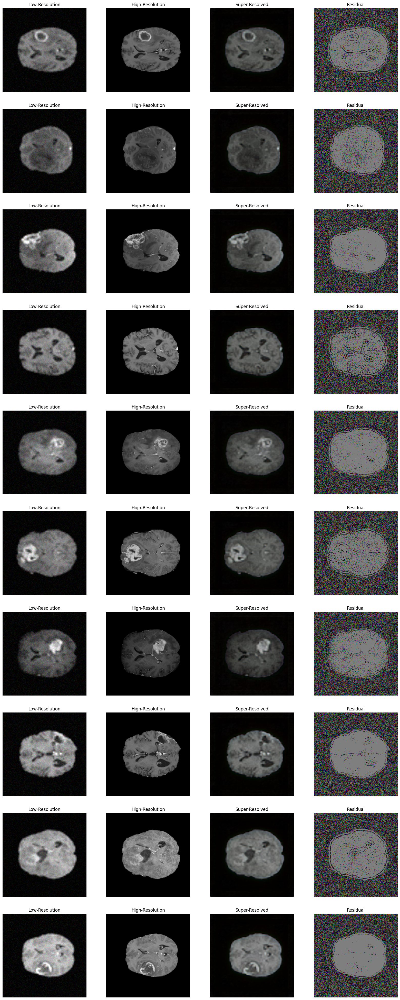

In [ ]:
import matplotlib.pyplot as plt

def display_images(lr_images, hr_images, sr_images, res_images, num_images=10):
    plt.figure(figsize=(20, 5 * num_images))

    for i in range(num_images):
        # LR image
        plt.subplot(num_images, 4, i * 4 + 1)
        plt.imshow(lr_images[i].cpu().permute(1, 2, 0))
        plt.title("Low-Resolution")
        plt.axis('off')

        # HR image
        plt.subplot(num_images, 4, i * 4 + 2)
        plt.imshow(hr_images[i].cpu().permute(1, 2, 0))
        plt.title("High-Resolution")
        plt.axis('off')

        # Super-resolved image
        plt.subplot(num_images, 4, i * 4 + 3)
        plt.imshow(sr_images[i].cpu().permute(1, 2, 0))
        plt.title("Super-Resolved")
        plt.axis('off')

        # Residual image
        plt.subplot(num_images, 4, i * 4 + 4)
        plt.imshow(res_images[i].cpu().permute(1, 2, 0))
        plt.title("Residual")
        plt.axis('off')

    plt.show()

# Call the function to display the images
display_images(lr_images, hr_images, sr_images, res_images)


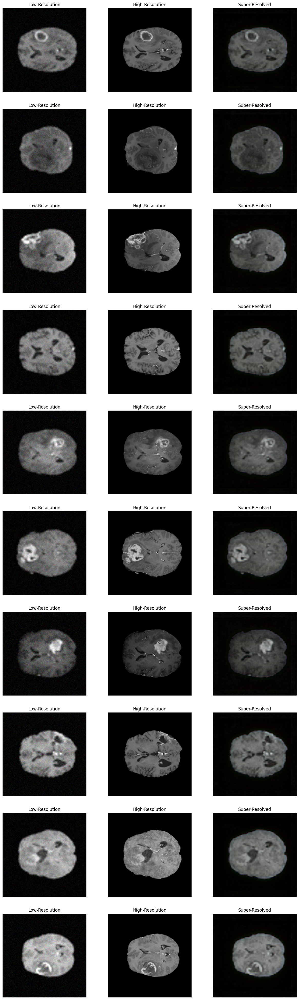

In [ ]:
import matplotlib.pyplot as plt

def display_images(lr_images, hr_images, sr_images, num_images=10):
    plt.figure(figsize=(15, 5 * num_images))

    for i in range(num_images):
        # LR image
        plt.subplot(num_images, 3, i * 3 + 1)
        plt.imshow(lr_images[i].cpu().permute(1, 2, 0))
        plt.title("Low-Resolution")
        plt.axis('off')

        # HR image
        plt.subplot(num_images, 3, i * 3 + 2)
        plt.imshow(hr_images[i].cpu().permute(1, 2, 0))
        plt.title("High-Resolution")
        plt.axis('off')

        # Super-resolved image
        plt.subplot(num_images, 3, i * 3 + 3)
        plt.imshow(sr_images[i].cpu().permute(1, 2, 0))
        plt.title("Super-Resolved")
        plt.axis('off')

    plt.show()

# Call the function to display the images
display_images(lr_images, hr_images, sr_images)
